In [16]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.impute import KNNImputer
from sklearn.impute import SimpleImputer
import missingno as msno
from sklearn.preprocessing import LabelEncoder
import warnings
warnings.filterwarnings("ignore")
from sklearn.model_selection import train_test_split
from scipy.stats import skew
from scipy.stats import skewtest
from scipy.stats import f_oneway
from scipy.stats import ttest_ind
from statsmodels.formula.api import ols
import statsmodels.api as sm

In [3]:
datax = pd.read_csv('employee.csv')
datax = datax.drop('Unnamed: 0',axis = 1)
datax

,EmployeeNumber,Attrition,Age,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,1,Yes,41,Travel_Rarely,1102,Sales,1,2,Life Sciences,2,...,1,80,0,8,0,1,6,4,0,5
1,2,No,49,Travel_Frequently,279,Research & Development,8,1,Life Sciences,3,...,4,80,1,10,3,3,10,7,1,7
2,3,Yes,37,Travel_Rarely,1373,Research & Development,2,2,Other,4,...,2,80,0,7,3,3,0,0,0,0
3,4,No,33,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,4,...,3,80,0,8,3,3,8,7,3,0
4,5,No,27,Travel_Rarely,591,Research & Development,2,1,Medical,1,...,4,80,1,6,3,3,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2935,2936,No,36,Travel_Frequently,884,Research & Development,23,2,Medical,3,...,3,80,1,17,3,3,5,2,0,3
2936,2937,No,39,Travel_Rarely,613,Research & Development,6,1,Medical,4,...,1,80,1,9,5,3,7,7,1,7
2937,2938,No,27,Travel_Rarely,155,Research & Development,4,3,Life Sciences,2,...,2,80,1,6,0,3,6,2,0,3
2938,2939,No,49,Travel_Frequently,1023,Sales,2,3,Medical,4,...,4,80,0,17,3,2,9,6,0,8


In [4]:
data = datax.select_dtypes(include = 'number')

## Melakukan EDA terhadap data- data yang ada

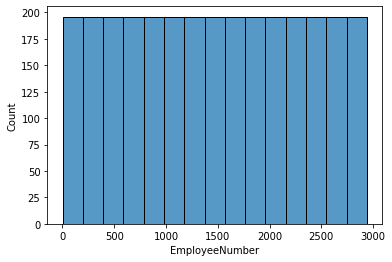

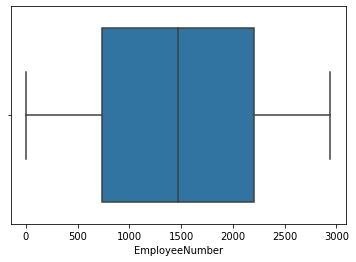

count    2940.000000
mean     1470.500000
std       848.849221
min         1.000000
25%       735.750000
50%      1470.500000
75%      2205.250000
max      2940.000000
Name: EmployeeNumber, dtype: float64
IQR: 1469.5
UL: 2940
LL: 1
Count Outlier: 0
Prop Outlier: 0
Outlier: []
skew: 0.0
skewtest: SkewtestResult(statistic=1.0010078382403174, pvalue=0.3168230189432971)


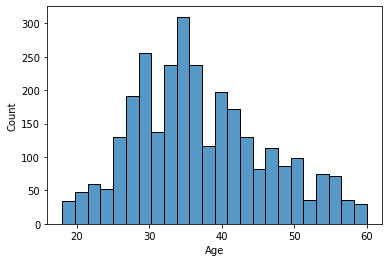

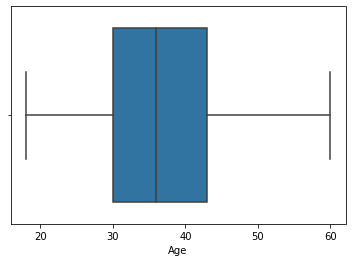

count    2940.000000
mean       36.923810
std         9.133819
min        18.000000
25%        30.000000
50%        36.000000
75%        43.000000
max        60.000000
Name: Age, dtype: float64
IQR: 13.0
UL: 60
LL: 18
Count Outlier: 0
Prop Outlier: 0
Outlier: []
skew: 0.4128644615478507
skewtest: SkewtestResult(statistic=8.813374700649044, pvalue=1.2143382069378949e-18)


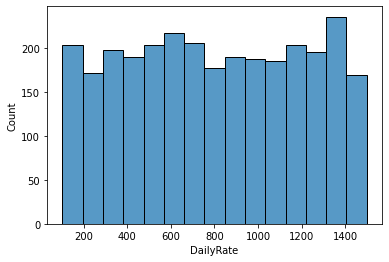

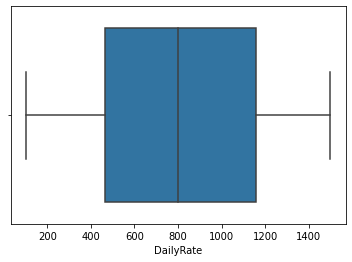

count    2940.000000
mean      802.485714
std       403.440447
min       102.000000
25%       465.000000
50%       802.000000
75%      1157.000000
max      1499.000000
Name: DailyRate, dtype: float64
IQR: 692.0
UL: 1499
LL: 102
Count Outlier: 0
Prop Outlier: 0
Outlier: []
skew: -0.0035149769582910268
skewtest: SkewtestResult(statistic=-0.07800437368682583, pvalue=0.9378245738968809)


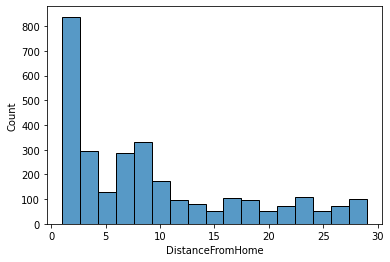

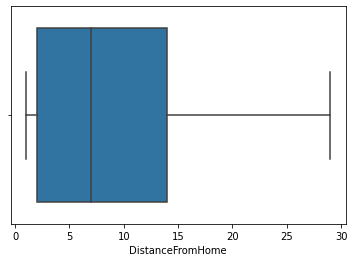

count    2940.000000
mean        9.192517
std         8.105485
min         1.000000
25%         2.000000
50%         7.000000
75%        14.000000
max        29.000000
Name: DistanceFromHome, dtype: float64
IQR: 12.0
UL: 29
LL: 1
Count Outlier: 0
Prop Outlier: 0
Outlier: []
skew: 0.9571400469829039
skewtest: SkewtestResult(statistic=18.1014778752387, pvalue=3.1023107819184016e-73)


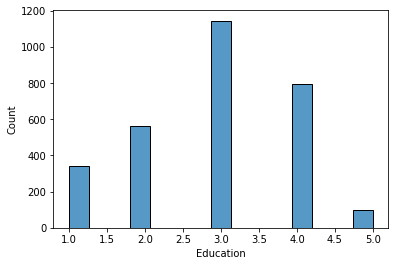

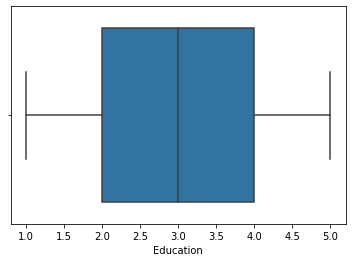

count    2940.000000
mean        2.912925
std         1.023991
min         1.000000
25%         2.000000
50%         3.000000
75%         4.000000
max         5.000000
Name: Education, dtype: float64
IQR: 2.0
UL: 5
LL: 1
Count Outlier: 0
Prop Outlier: 0
Outlier: []
skew: -0.2893854052028824
skewtest: SkewtestResult(statistic=-6.295603942149894, pvalue=3.0620529158836935e-10)


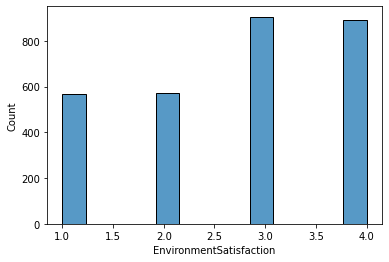

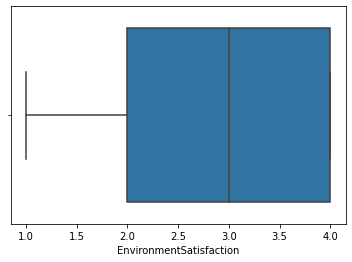

count    2940.000000
mean        2.721769
std         1.092896
min         1.000000
25%         2.000000
50%         3.000000
75%         4.000000
max         4.000000
Name: EnvironmentSatisfaction, dtype: float64
IQR: 2.0
UL: 4
LL: 1
Count Outlier: 0
Prop Outlier: 0
Outlier: []
skew: -0.3213261358382832
skewtest: SkewtestResult(statistic=-6.959811236067978, pvalue=3.4072896924386745e-12)


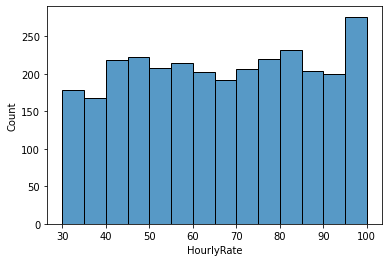

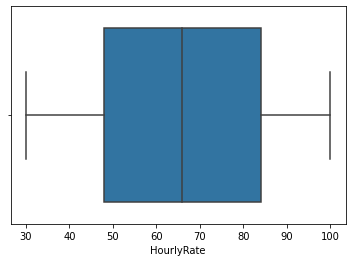

count    2940.000000
mean       65.891156
std        20.325969
min        30.000000
25%        48.000000
50%        66.000000
75%        84.000000
max       100.000000
Name: HourlyRate, dtype: float64
IQR: 36.0
UL: 100
LL: 30
Count Outlier: 0
Prop Outlier: 0
Outlier: []
skew: -0.03227797319055414
skewtest: SkewtestResult(statistic=-0.7161299941994642, pvalue=0.4739110846945963)


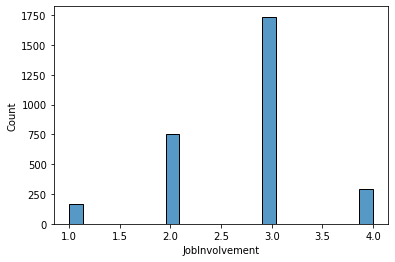

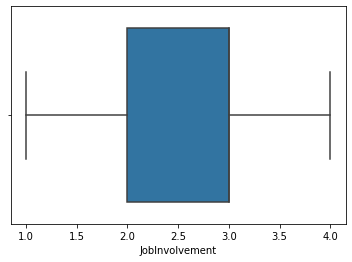

count    2940.000000
mean        2.729932
std         0.711440
min         1.000000
25%         2.000000
50%         3.000000
75%         3.000000
max         4.000000
Name: JobInvolvement, dtype: float64
IQR: 1.0
UL: 4
LL: 1
Count Outlier: 0
Prop Outlier: 0
Outlier: []
skew: -0.49791062862696706
skewtest: SkewtestResult(statistic=-10.46301247154075, pvalue=1.2772889142432348e-25)


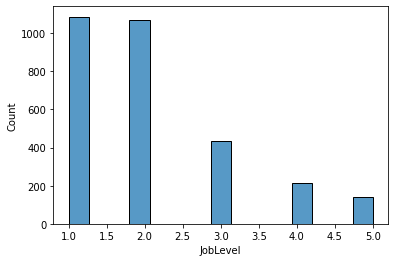

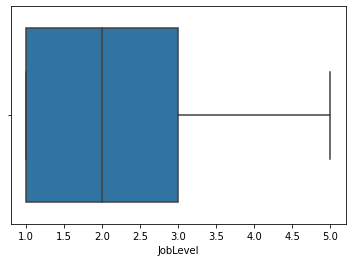

count    2940.000000
mean        2.063946
std         1.106752
min         1.000000
25%         1.000000
50%         2.000000
75%         3.000000
max         5.000000
Name: JobLevel, dtype: float64
IQR: 2.0
UL: 5
LL: 1
Count Outlier: 0
Prop Outlier: 0
Outlier: []
skew: 1.0243546583925869
skewtest: SkewtestResult(statistic=19.052364536134256, pvalue=6.280041557060713e-81)


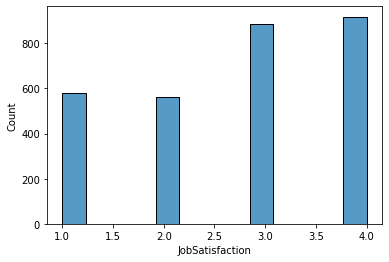

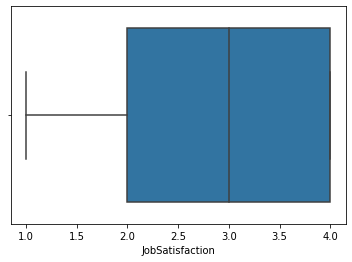

count    2940.000000
mean        2.728571
std         1.102658
min         1.000000
25%         2.000000
50%         3.000000
75%         4.000000
max         4.000000
Name: JobSatisfaction, dtype: float64
IQR: 2.0
UL: 4
LL: 1
Count Outlier: 0
Prop Outlier: 0
Outlier: []
skew: -0.3293354633089524
skewtest: SkewtestResult(statistic=-7.125015974617371, pvalue=1.0406861736329698e-12)


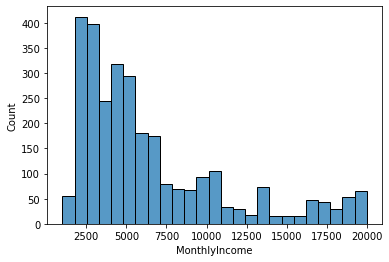

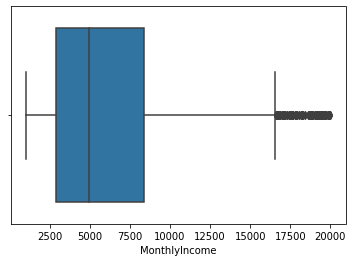

count     2940.000000
mean      6502.931293
std       4707.155770
min       1009.000000
25%       2911.000000
50%       4919.000000
75%       8380.000000
max      19999.000000
Name: MonthlyIncome, dtype: float64
IQR: 5469.0
UL: 16555
LL: 1009
Count Outlier: 228
Prop Outlier: 228
Outlier: [19094, 18947, 19545, 18740, 18844, 18172, 17328, 16959, 19537, 17181, 19926, 19033, 18722, 19999, 16792, 19232, 19517, 19068, 19202, 19436, 16872, 19045, 19144, 17584, 18665, 17068, 19272, 18300, 16659, 19406, 19197, 19566, 18041, 17046, 17861, 16835, 16595, 19502, 18200, 16627, 19513, 19141, 19189, 16856, 19859, 18430, 17639, 16752, 19246, 17159, 17924, 17099, 17444, 17399, 19419, 18303, 19973, 19845, 17650, 19237, 19627, 16756, 17665, 16885, 17465, 19626, 19943, 18606, 17048, 17856, 19081, 17779, 19740, 18711, 18265, 18213, 18824, 18789, 19847, 19190, 18061, 17123, 16880, 17861, 19187, 19717, 16799, 17328, 19701, 17169, 16598, 17007, 16606, 19586, 19331, 19613, 17567, 19049, 19658, 17426, 17603, 167

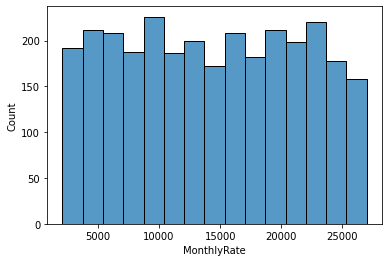

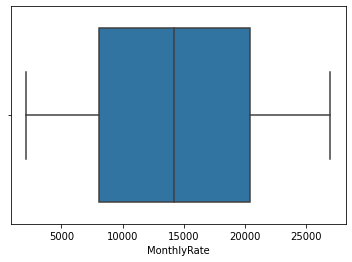

count     2940.000000
mean     14313.103401
std       7116.575021
min       2094.000000
25%       8045.000000
50%      14235.500000
75%      20462.000000
max      26999.000000
Name: MonthlyRate, dtype: float64
IQR: 12417.0
UL: 26999
LL: 2094
Count Outlier: 0
Prop Outlier: 0
Outlier: []
skew: 0.01855884556846041
skewtest: SkewtestResult(statistic=0.41182400336723884, pvalue=0.6804684265009102)


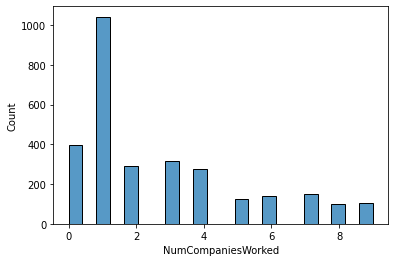

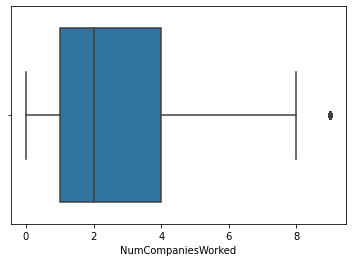

count    2940.000000
mean        2.693197
std         2.497584
min         0.000000
25%         1.000000
50%         2.000000
75%         4.000000
max         9.000000
Name: NumCompaniesWorked, dtype: float64
IQR: 3.0
UL: 8
LL: 0
Count Outlier: 104
Prop Outlier: 104
Outlier: [9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9]
skew: 1.0254233954371303
skewtest: SkewtestResult(statistic=19.067177504506972, pvalue=4.731639919818368e-81)


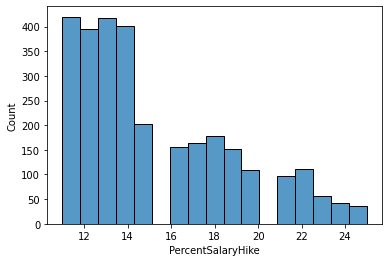

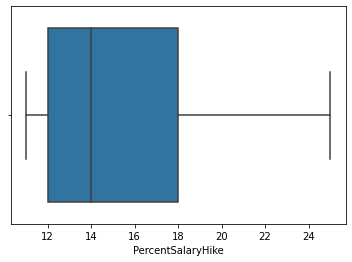

count    2940.000000
mean       15.209524
std         3.659315
min        11.000000
25%        12.000000
50%        14.000000
75%        18.000000
max        25.000000
Name: PercentSalaryHike, dtype: float64
IQR: 6.0
UL: 25
LL: 11
Count Outlier: 0
Prop Outlier: 0
Outlier: []
skew: 0.8202898522796265
skewtest: SkewtestResult(statistic=16.041863179092097, pvalue=6.516948961970625e-58)


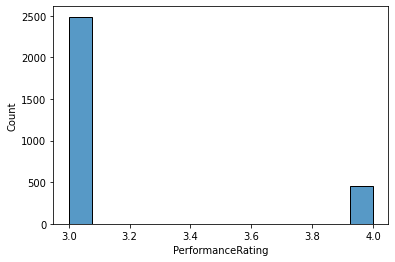

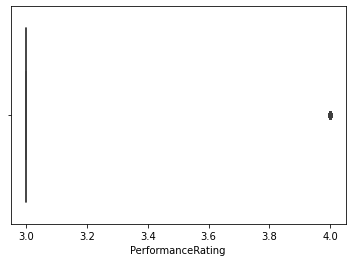

count    2940.000000
mean        3.153741
std         0.360762
min         3.000000
25%         3.000000
50%         3.000000
75%         3.000000
max         4.000000
Name: PerformanceRating, dtype: float64
IQR: 0.0
UL: 3
LL: 3
Count Outlier: 452
Prop Outlier: 452
Outlier: [4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4

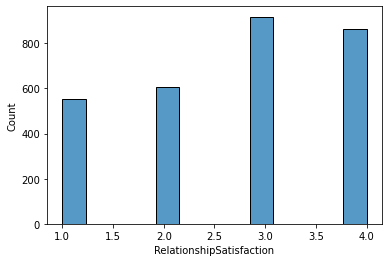

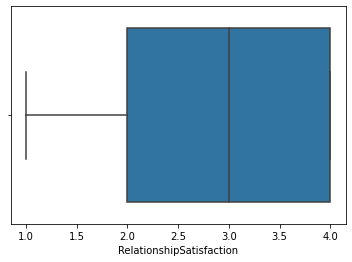

count    2940.000000
mean        2.712245
std         1.081025
min         1.000000
25%         2.000000
50%         3.000000
75%         4.000000
max         4.000000
Name: RelationshipSatisfaction, dtype: float64
IQR: 2.0
UL: 4
LL: 1
Count Outlier: 0
Prop Outlier: 0
Outlier: []
skew: -0.3025184698222079
skewtest: SkewtestResult(statistic=-6.569728847783072, pvalue=5.0406968700948565e-11)


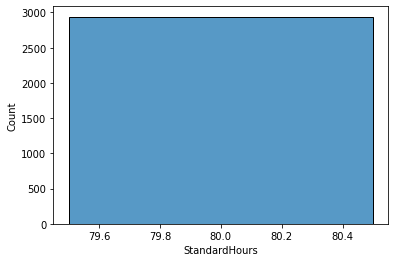

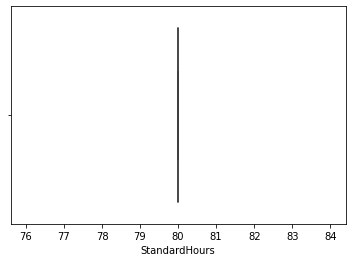

count    2940.0
mean       80.0
std         0.0
min        80.0
25%        80.0
50%        80.0
75%        80.0
max        80.0
Name: StandardHours, dtype: float64
IQR: 0.0
UL: 80
LL: 80
Count Outlier: 0
Prop Outlier: 0
Outlier: []
skew: 0.0
skewtest: SkewtestResult(statistic=1.0010078382403174, pvalue=0.3168230189432971)


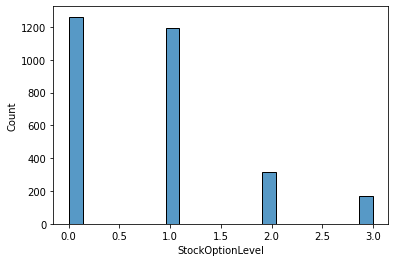

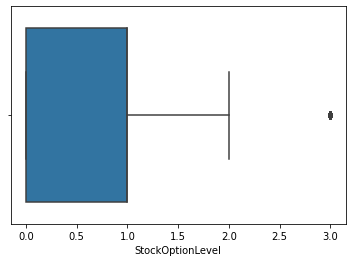

count    2940.000000
mean        0.793878
std         0.851932
min         0.000000
25%         0.000000
50%         1.000000
75%         1.000000
max         3.000000
Name: StockOptionLevel, dtype: float64
IQR: 1.0
UL: 2
LL: 0
Count Outlier: 170
Prop Outlier: 170
Outlier: [3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3]
skew: 0.9679912809556102
skewtest: SkewtestResult(statistic=18.257598212642677, pvalue=1.8003843683669165e-74)


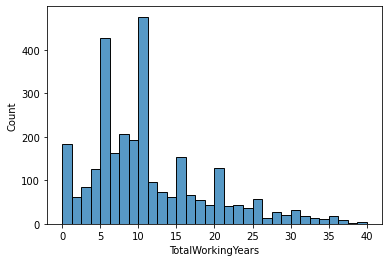

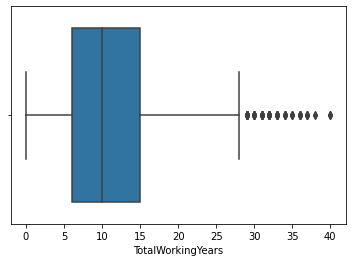

count    2940.000000
mean       11.279592
std         7.779458
min         0.000000
25%         6.000000
50%        10.000000
75%        15.000000
max        40.000000
Name: TotalWorkingYears, dtype: float64
IQR: 9.0
UL: 28
LL: 0
Count Outlier: 126
Prop Outlier: 126
Outlier: [31, 29, 37, 38, 30, 40, 36, 34, 32, 33, 37, 30, 36, 31, 33, 32, 37, 31, 32, 32, 30, 34, 30, 40, 29, 35, 31, 33, 31, 29, 32, 30, 33, 30, 29, 31, 32, 33, 36, 34, 31, 36, 33, 31, 29, 33, 29, 32, 31, 35, 29, 32, 34, 36, 32, 30, 36, 29, 34, 37, 29, 29, 35, 31, 29, 37, 38, 30, 40, 36, 34, 32, 33, 37, 30, 36, 31, 33, 32, 37, 31, 32, 32, 30, 34, 30, 40, 29, 35, 31, 33, 31, 29, 32, 30, 33, 30, 29, 31, 32, 33, 36, 34, 31, 36, 33, 31, 29, 33, 29, 32, 31, 35, 29, 32, 34, 36, 32, 30, 36, 29, 34, 37, 29, 29, 35]
skew: 1.11603155825941
skewtest: SkewtestResult(statistic=20.289610312294126, pvalue=1.5884922366175207e-91)


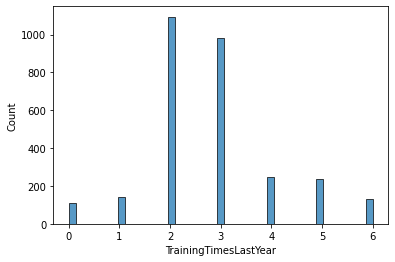

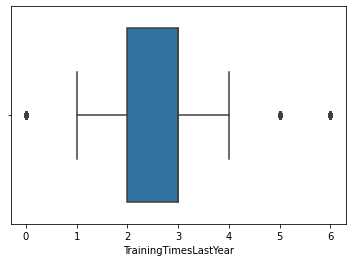

count    2940.000000
mean        2.799320
std         1.289051
min         0.000000
25%         2.000000
50%         3.000000
75%         3.000000
max         6.000000
Name: TrainingTimesLastYear, dtype: float64
IQR: 1.0
UL: 4
LL: 1
Count Outlier: 476
Prop Outlier: 476
Outlier: [0, 5, 5, 5, 6, 5, 5, 5, 6, 6, 0, 0, 0, 5, 0, 5, 5, 5, 6, 6, 5, 0, 6, 5, 5, 0, 5, 5, 6, 5, 5, 5, 0, 5, 5, 5, 5, 6, 6, 5, 5, 5, 5, 0, 0, 5, 5, 5, 6, 6, 5, 0, 5, 0, 5, 5, 0, 6, 0, 5, 5, 6, 6, 5, 6, 5, 0, 5, 5, 5, 5, 0, 6, 5, 5, 5, 5, 6, 5, 5, 6, 5, 5, 5, 0, 5, 0, 5, 5, 6, 5, 6, 5, 0, 5, 5, 0, 6, 6, 5, 6, 0, 5, 0, 6, 6, 6, 6, 5, 5, 0, 5, 0, 0, 6, 0, 6, 5, 6, 5, 5, 0, 5, 6, 6, 5, 5, 0, 0, 6, 0, 0, 5, 0, 5, 6, 5, 5, 6, 6, 5, 5, 5, 5, 5, 6, 5, 6, 6, 0, 6, 6, 5, 5, 0, 0, 6, 6, 0, 5, 0, 0, 0, 0, 0, 5, 5, 6, 5, 5, 0, 5, 5, 0, 5, 5, 6, 5, 5, 5, 6, 5, 5, 5, 0, 0, 5, 5, 5, 5, 6, 0, 0, 6, 6, 6, 6, 5, 5, 5, 6, 5, 0, 5, 5, 6, 5, 6, 6, 5, 6, 6, 5, 0, 5, 5, 5, 5, 5, 0, 0, 0, 6, 5, 6, 6, 5, 6, 0, 6, 6, 5, 6, 6, 5, 5, 5, 0, 0, 5, 

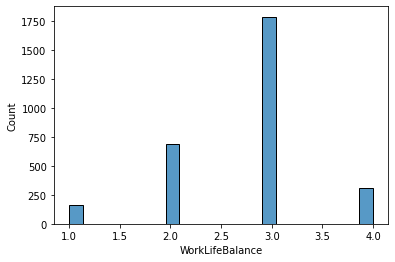

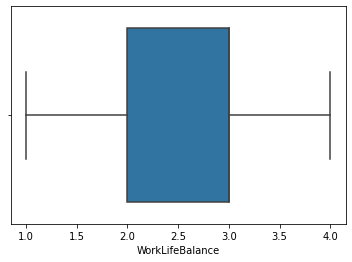

count    2940.000000
mean        2.761224
std         0.706356
min         1.000000
25%         2.000000
50%         3.000000
75%         3.000000
max         4.000000
Name: WorkLifeBalance, dtype: float64
IQR: 1.0
UL: 4
LL: 1
Count Outlier: 0
Prop Outlier: 0
Outlier: []
skew: -0.5519163838185224
skewtest: SkewtestResult(statistic=-11.472257668483971, pvalue=1.8185197151995864e-30)


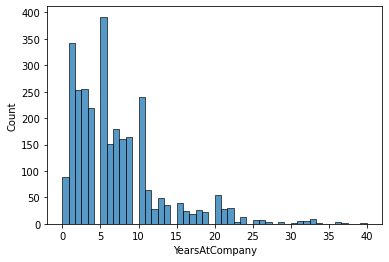

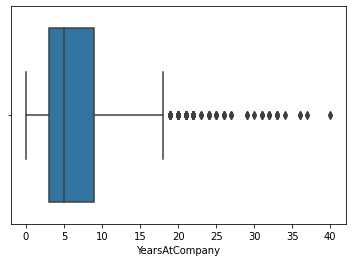

count    2940.000000
mean        7.008163
std         6.125483
min         0.000000
25%         3.000000
50%         5.000000
75%         9.000000
max        40.000000
Name: YearsAtCompany, dtype: float64
IQR: 6.0
UL: 18
LL: 0
Count Outlier: 208
Prop Outlier: 208
Outlier: [25, 22, 22, 27, 21, 22, 37, 25, 20, 40, 20, 24, 20, 24, 33, 20, 19, 22, 33, 24, 19, 21, 20, 36, 20, 20, 22, 24, 21, 21, 25, 21, 29, 20, 27, 20, 31, 32, 20, 20, 21, 22, 22, 34, 24, 26, 31, 20, 31, 26, 19, 21, 21, 32, 21, 19, 20, 22, 20, 21, 26, 20, 22, 24, 33, 29, 25, 21, 19, 19, 20, 19, 33, 19, 19, 20, 20, 20, 20, 20, 32, 20, 21, 33, 36, 26, 30, 22, 23, 23, 21, 21, 22, 22, 19, 22, 19, 22, 20, 20, 20, 22, 20, 20, 25, 22, 22, 27, 21, 22, 37, 25, 20, 40, 20, 24, 20, 24, 33, 20, 19, 22, 33, 24, 19, 21, 20, 36, 20, 20, 22, 24, 21, 21, 25, 21, 29, 20, 27, 20, 31, 32, 20, 20, 21, 22, 22, 34, 24, 26, 31, 20, 31, 26, 19, 21, 21, 32, 21, 19, 20, 22, 20, 21, 26, 20, 22, 24, 33, 29, 25, 21, 19, 19, 20, 19, 33, 19, 19, 20, 20, 20

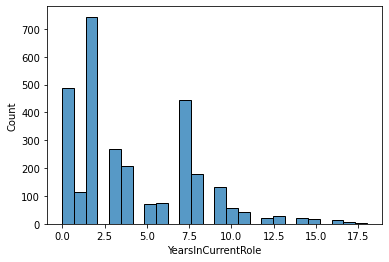

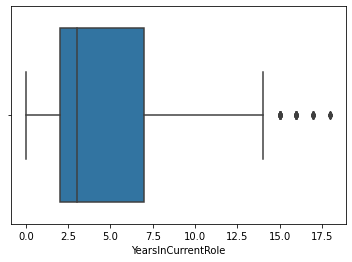

count    2940.000000
mean        4.229252
std         3.622521
min         0.000000
25%         2.000000
50%         3.000000
75%         7.000000
max        18.000000
Name: YearsInCurrentRole, dtype: float64
IQR: 5.0
UL: 14
LL: 0
Count Outlier: 42
Prop Outlier: 42
Outlier: [15, 16, 18, 15, 18, 17, 16, 15, 16, 15, 16, 16, 15, 16, 17, 15, 15, 15, 17, 17, 16, 15, 16, 18, 15, 18, 17, 16, 15, 16, 15, 16, 16, 15, 16, 17, 15, 15, 15, 17, 17, 16]
skew: 0.9164268059808774
skewtest: SkewtestResult(statistic=17.50652076391757, pvalue=1.2776855008203247e-68)


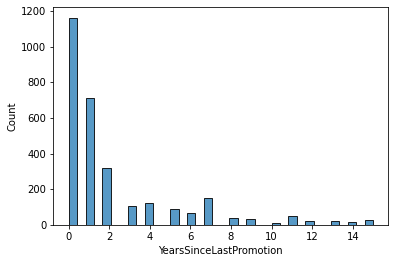

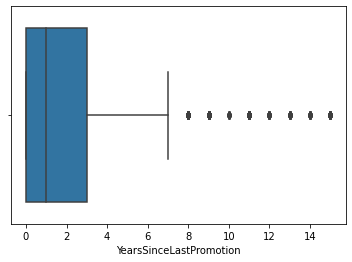

count    2940.000000
mean        2.187755
std         3.221882
min         0.000000
25%         0.000000
50%         1.000000
75%         3.000000
max        15.000000
Name: YearsSinceLastPromotion, dtype: float64
IQR: 3.0
UL: 7
LL: 0
Count Outlier: 214
Prop Outlier: 214
Outlier: [8, 15, 8, 8, 9, 13, 12, 10, 11, 9, 12, 15, 15, 15, 9, 11, 11, 9, 12, 11, 15, 11, 10, 9, 11, 9, 8, 11, 11, 8, 13, 9, 9, 12, 10, 11, 15, 13, 9, 11, 10, 8, 8, 11, 9, 11, 12, 11, 14, 13, 14, 8, 11, 15, 10, 11, 11, 15, 11, 13, 11, 13, 15, 8, 13, 15, 11, 14, 15, 15, 9, 11, 9, 8, 9, 15, 11, 12, 9, 8, 10, 14, 8, 13, 13, 12, 14, 8, 8, 8, 14, 14, 8, 12, 13, 14, 14, 12, 11, 8, 11, 9, 12, 8, 9, 11, 9, 8, 15, 8, 8, 9, 13, 12, 10, 11, 9, 12, 15, 15, 15, 9, 11, 11, 9, 12, 11, 15, 11, 10, 9, 11, 9, 8, 11, 11, 8, 13, 9, 9, 12, 10, 11, 15, 13, 9, 11, 10, 8, 8, 11, 9, 11, 12, 11, 14, 13, 14, 8, 11, 15, 10, 11, 11, 15, 11, 13, 11, 13, 15, 8, 13, 15, 11, 14, 15, 15, 9, 11, 9, 8, 9, 15, 11, 12, 9, 8, 10, 14, 8, 13, 13, 12, 14, 8, 

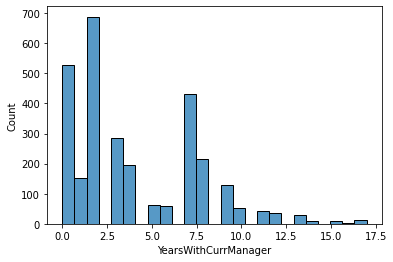

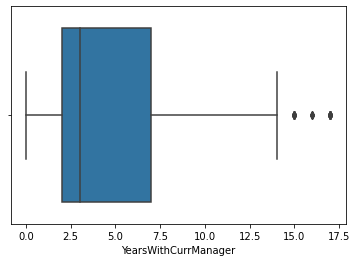

count    2940.000000
mean        4.123129
std         3.567529
min         0.000000
25%         2.000000
50%         3.000000
75%         7.000000
max        17.000000
Name: YearsWithCurrManager, dtype: float64
IQR: 5.0
UL: 14
LL: 0
Count Outlier: 28
Prop Outlier: 28
Outlier: [17, 15, 15, 15, 15, 17, 16, 17, 15, 17, 17, 17, 17, 16, 17, 15, 15, 15, 15, 17, 16, 17, 15, 17, 17, 17, 17, 16]
skew: 0.832600290620938
skewtest: SkewtestResult(statistic=16.23423821365354, pvalue=2.8881104371329895e-59)


In [46]:
for i in data.columns:
    sns.histplot(data[i])
    plt.show()
    sns.boxplot(data[i])
    plt.show()
    q1 = data[i].describe(include='all').loc['25%']
    q3 = data[i].describe(include='all').loc['75%']
    iqr = q3-q1
    upper = q3 + 1.5*iqr
    lower = q1 - 1.5*iqr
    ul = np.max(data[i][data[i]<=upper])
    ll = np.min(data[i][data[i]>=lower])
    outlier = data[i][(data[i]>upper)|(data[i]<lower)]
    print(data[i].describe())
    print('IQR:',iqr)
    print('UL:',ul)
    print('LL:',ll)
    print('Count Outlier:', len(outlier))
    print('Prop Outlier:',len(outlier/len(data[i])))
    print('Outlier:',list(outlier))
    print('skew:',skew(data[i]))
    print('skewtest:',skewtest(data[i]))
    

-> Umur karyawan memiliki rentang dari 18 s.d. 60

-> Rata-rata jarak dari rumah ke kantor adalah 2-14 km. Dengan jarak terjauh mencapai 29 km

-> Education terbanyak adalah 3 diikuti dengan 4

-> Kantor memiliki lingkungan yang baik dengan nilai kepuasan rata2 sebesar 2.7 dan juga work life balance dengan nilai yang sama

-> Seluruh karyawan memiliki performa yang baik, tidak ada nilai 2 apalagi 1

-> Rentang lama karyawan bekerja di perusahaan adalah 6-15 tahun, tapi ada pula senior yang sudah bekerja sampai 40 tahun

-> Kebanyakan karyawan menjadikan perusahaan ini sebagai perusahaan kedua mereka bekerja


In [30]:
data_cat = datax.select_dtypes(include = 'object')

Kategori Unik Kolom Attrition:['Yes', 'No']


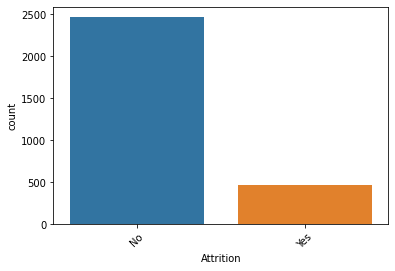

Kategori Unik Kolom BusinessTravel:['Travel_Rarely', 'Travel_Frequently', 'Non-Travel']


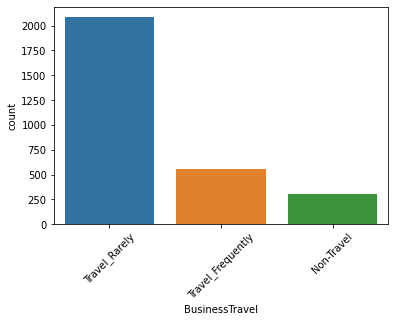

Kategori Unik Kolom Department:['Sales', 'Research & Development', 'Human Resources']


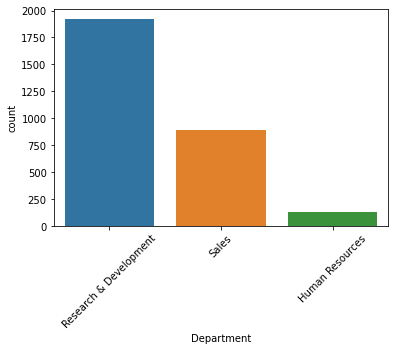

Kategori Unik Kolom EducationField:['Life Sciences', 'Other', 'Medical', 'Marketing', 'Technical Degree', 'Human Resources']


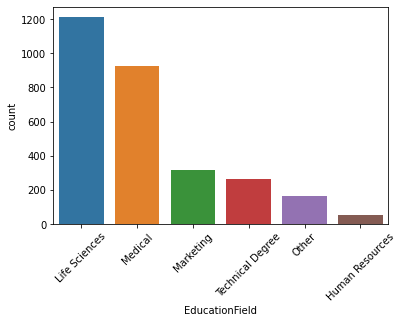

Kategori Unik Kolom Gender:['Female', 'Male']


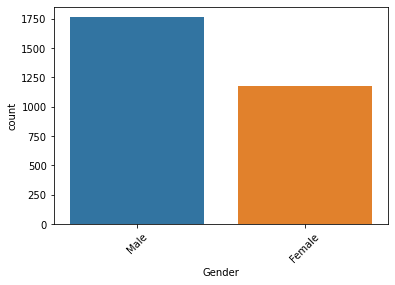

Kategori Unik Kolom JobRole:['Sales Executive', 'Research Scientist', 'Laboratory Technician', 'Manufacturing Director', 'Healthcare Representative', 'Manager', 'Sales Representative', 'Research Director', 'Human Resources']


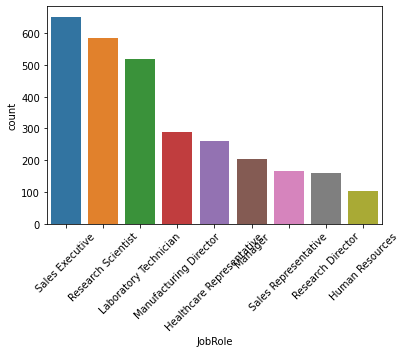

Kategori Unik Kolom MaritalStatus:['Single', 'Married', 'Divorced']


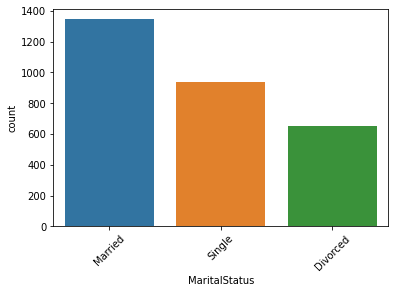

Kategori Unik Kolom Over18:['Y']


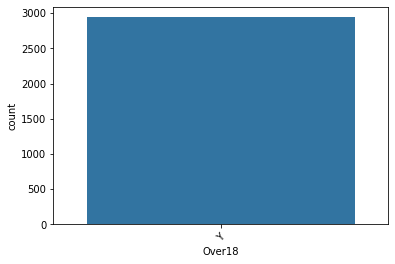

Kategori Unik Kolom OverTime:['Yes', 'No']


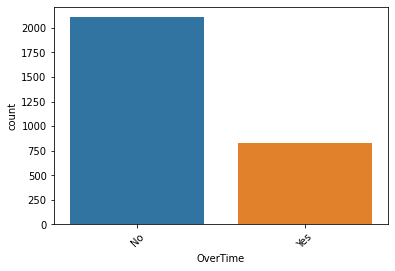

In [34]:
for i in data_cat.columns:
    print('Kategori Unik Kolom {}:{}'.format(i, list(data_cat[i].unique())))
    sns.countplot(data_cat[i], order=data_cat[i].value_counts().index)
    plt.xticks(rotation=45)
    plt.show()

-> Kebanyakan karyawan jarang melakukan perjalanan bisnis

-> Terdapat 3 divisi di dalam perusahaan, dimana divisi yang memiliki karyawan terbanyak adalah divisi RnD

-> Perusahaan bergerak dibidang life/medical. Hal ini dapat dilihat dari banyaknya karyawan yang bersekolah di bidang life science atau medical

-> Role terbanyak adalah Sales Executive diikuti dengan research scientist dan lab. technician

-> Perusahaan tidak mempekerjakan karyawan di bawah umur

-> Kebanyakan karyawan tidak melakukan kerja lembur

-> Kebanyakan karyawan memiliki status sudah menikah

(3) Lakukan EDA multivariat untuk tiap pasangan kolom numerik-numerik pada employee.csv yang mencakup:<p>
    a. scatterplot antar kolom numerik dengan kolom 'attrition' sebagai hue<p>
        b. identifikasi hal yang menurut anda menarik dari hasil EDA yang Anda dapatkan

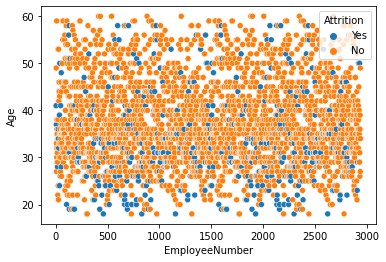

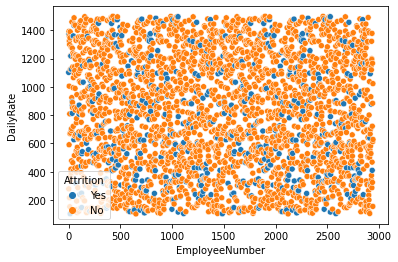

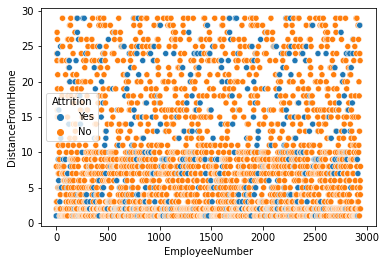

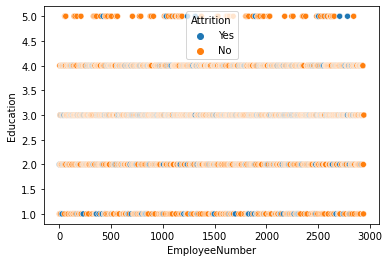

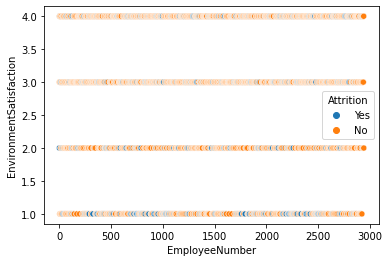

...

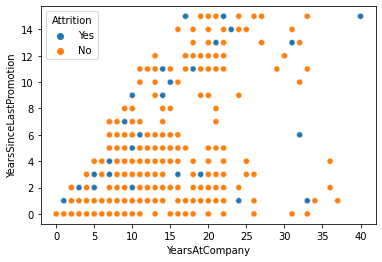

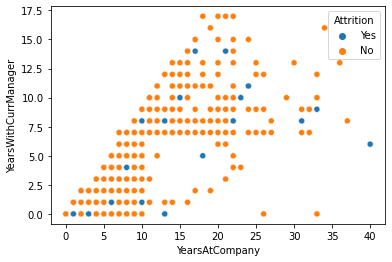

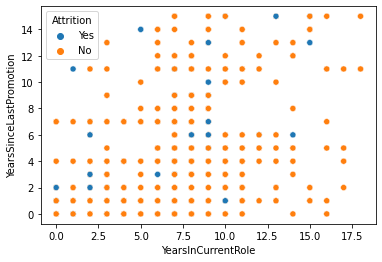

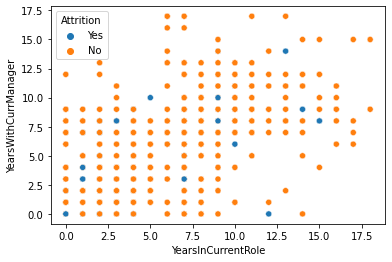

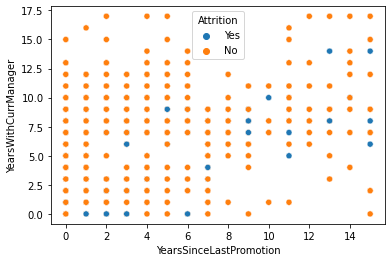

In [75]:
b = []
a = 1
for i in data.columns:
    for j in data.columns:
        if ([j,i] not in b) and (j!=i):
            sns.scatterplot(data = datax,x = i,y =j, hue = 'Attrition')
            plt.show()
            a += 1
            b.append([i,j])

-> Kolom- kolom yang memiliki korelasi<p>
    ** Age<p>
        -> Total Working Years<p>
        -> Years at Company<p>
        -> Years Current Role<p>
        -> Years Since Last Promotion<p>
        -> Years Curr Manager<p>
    ** Total Working years<p>
        -> Years at Company<p>
        -> Years Current Role <p>
        -> Years Since Last Promotion<p>
        -> Years Curr Manager<p>
    ** Years at Company<p>
        -> Years Current Role<p>
        -> Years Since Last Promotion<p>
        -> Years Curr Manager<p>

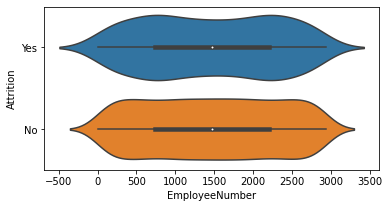

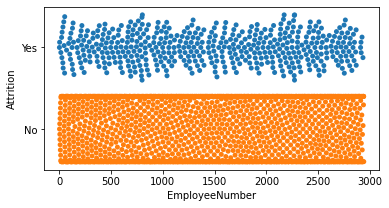

**************************************************


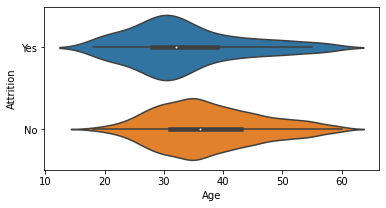

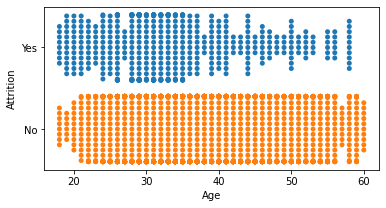

**************************************************


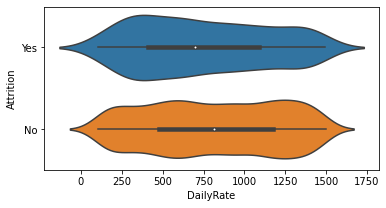

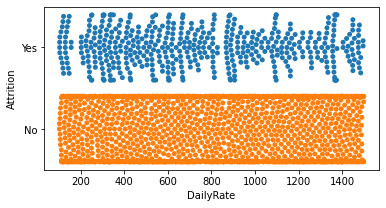

**************************************************


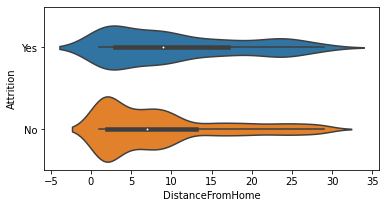

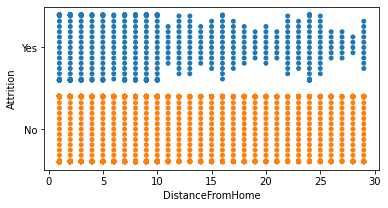

**************************************************


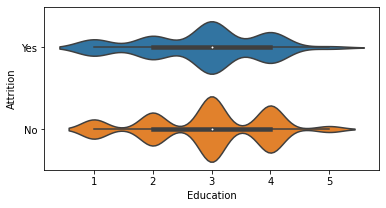

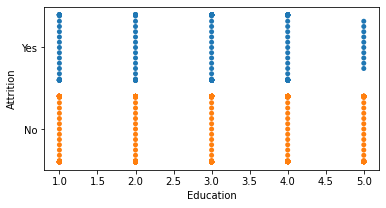

**************************************************


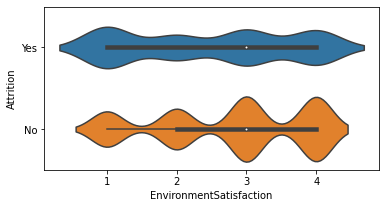

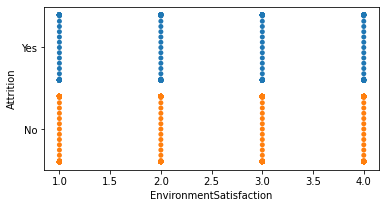

**************************************************


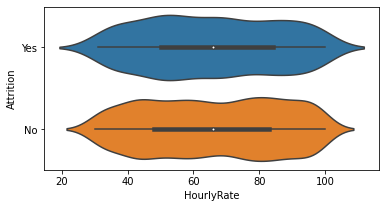

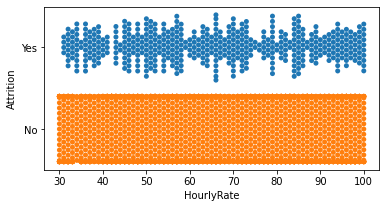

**************************************************


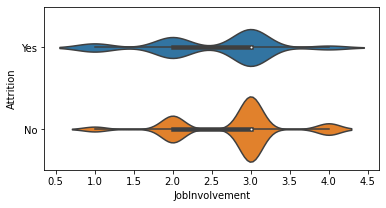

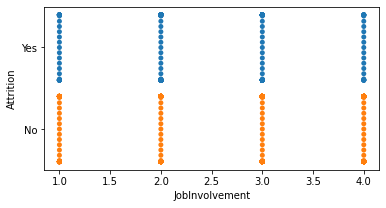

**************************************************


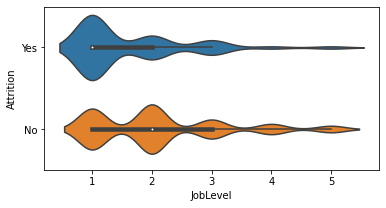

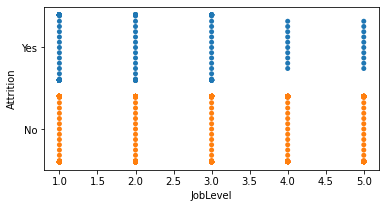

**************************************************


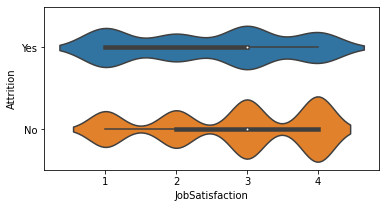

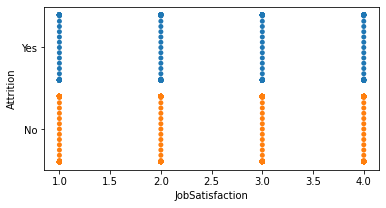

**************************************************


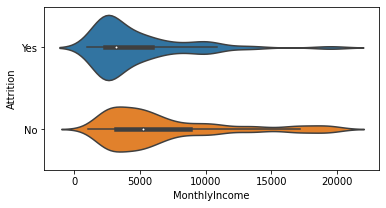

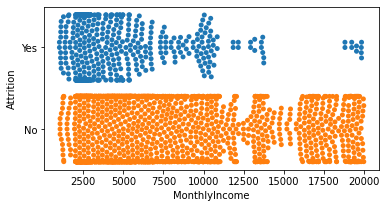

**************************************************


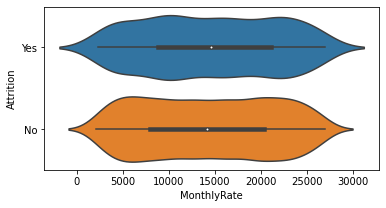

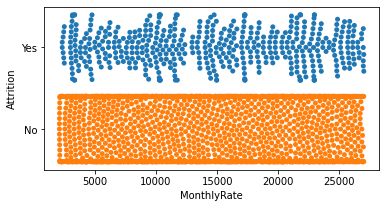

**************************************************


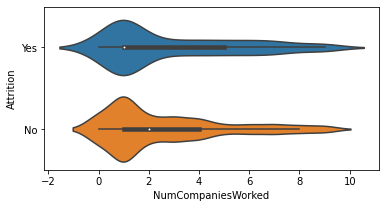

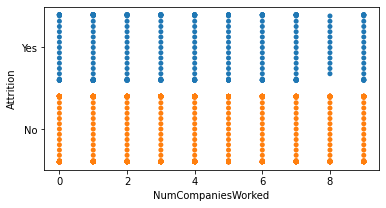

**************************************************


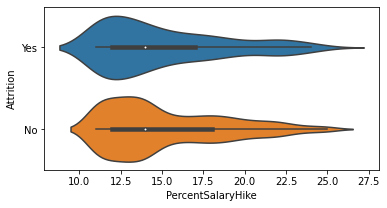

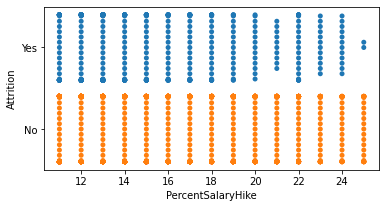

**************************************************


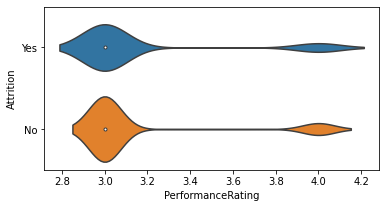

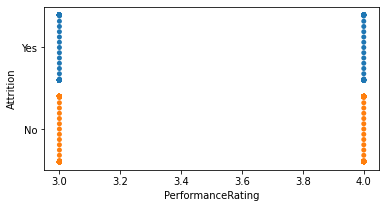

**************************************************


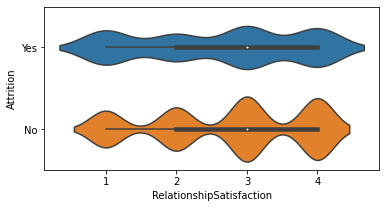

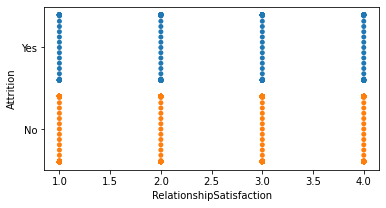

**************************************************


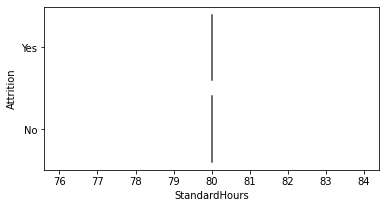

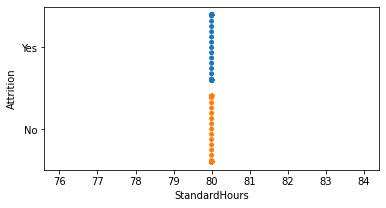

**************************************************


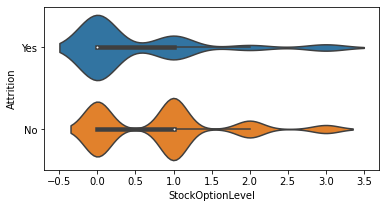

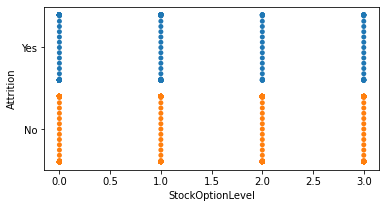

**************************************************


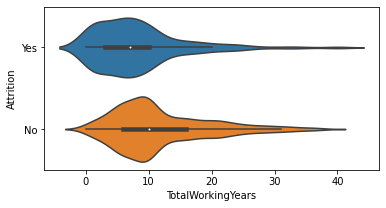

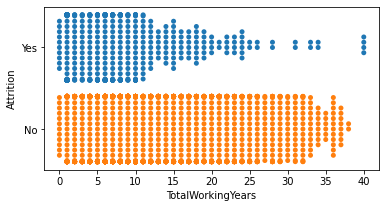

**************************************************


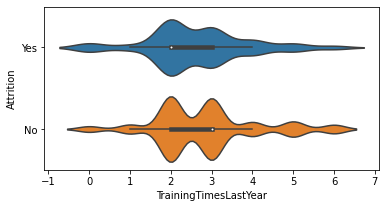

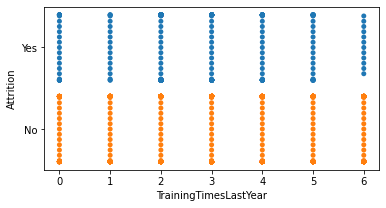

**************************************************


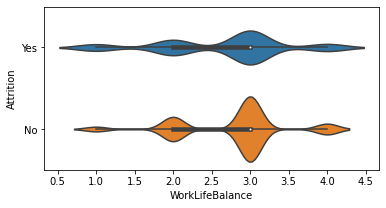

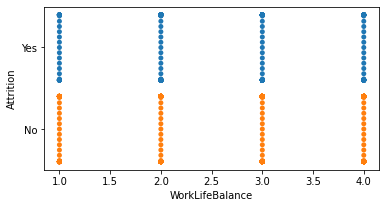

**************************************************


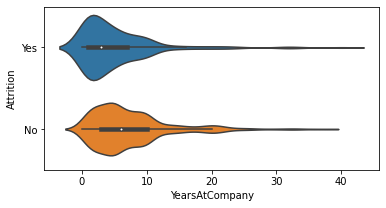

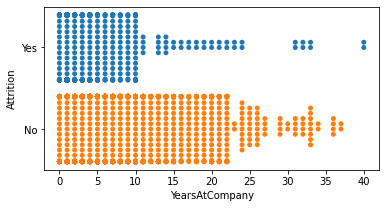

**************************************************


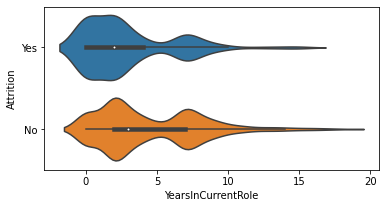

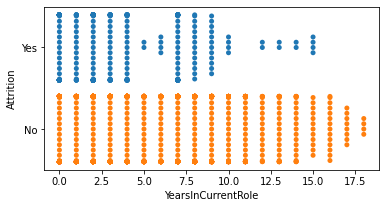

**************************************************


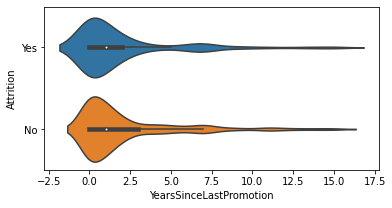

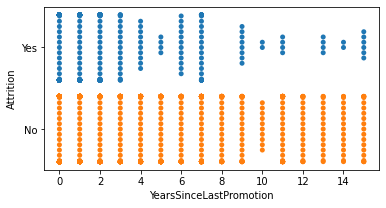

**************************************************


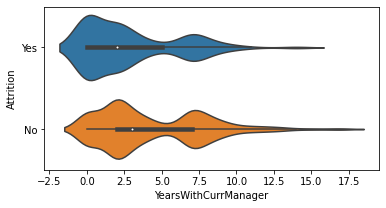

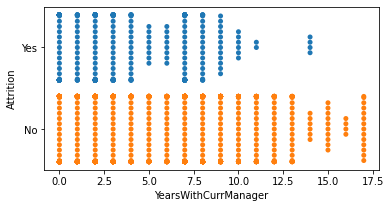

**************************************************


In [28]:
for i in data.columns:
    plt.figure(figsize = (6,3))
    sns.violinplot(x = i,y ='Attrition',data = datax)
    plt.show()
    plt.figure(figsize = (6,3))
    sns.swarmplot(x = i,y ='Attrition',data = datax)
    plt.show()
    print('*'*50)

-> Karyawan yang umurnya lebih muda cenderung Yes pada Attrition<p>
-> Hal ini memiliki korelasi positif pada Total Working Years yang lebih sedikit<p>
-> Karyawan yang jarak dari rumahnya lebih jauh cenderung Yes pada Attrition<p>
-> Job Level lebih tinggi cenderung No pada Attrition<p>
-> Monthly Income lebih tinggi cenderung No pada Attrition<p>

-----------
Attrition |
-----------


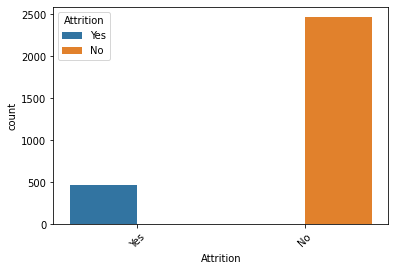

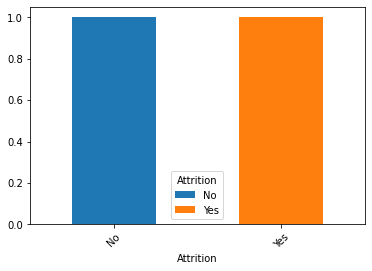

Attrition   No  Yes
Attrition          
No         1.0  0.0
Yes        0.0  1.0

**************************************************
----------------
BusinessTravel |
----------------


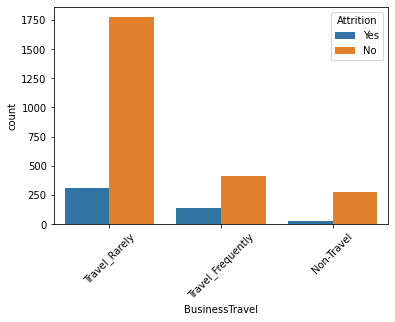

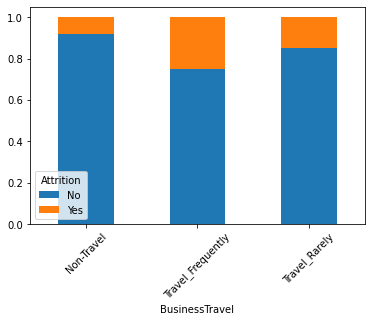

Attrition                No       Yes
BusinessTravel                       
Non-Travel         0.920000  0.080000
Travel_Frequently  0.750903  0.249097
Travel_Rarely      0.850431  0.149569

**************************************************
------------
Department |
------------


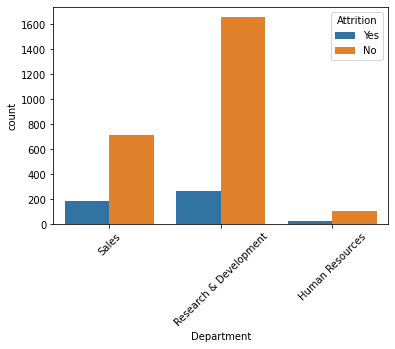

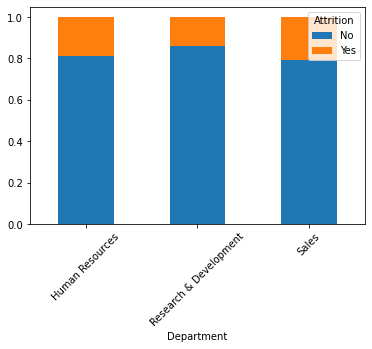

Attrition                     No       Yes
Department                                
Human Resources         0.809524  0.190476
Research & Development  0.861602  0.138398
Sales                   0.793722  0.206278

**************************************************
----------------
EducationField |
----------------


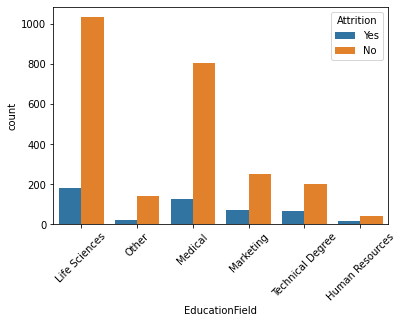

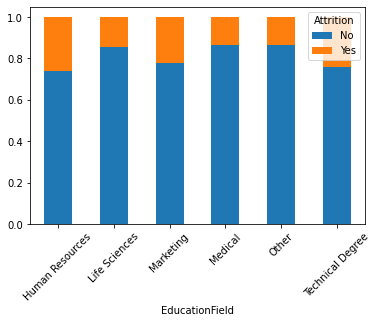

Attrition               No       Yes
EducationField                      
Human Resources   0.740741  0.259259
Life Sciences     0.853135  0.146865
Marketing         0.779874  0.220126
Medical           0.864224  0.135776
Other             0.865854  0.134146
Technical Degree  0.757576  0.242424

**************************************************
--------
Gender |
--------


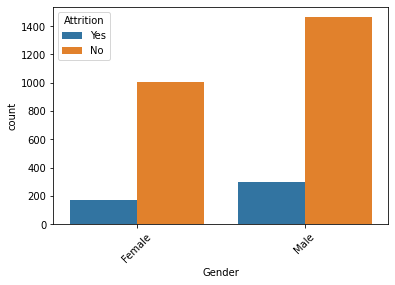

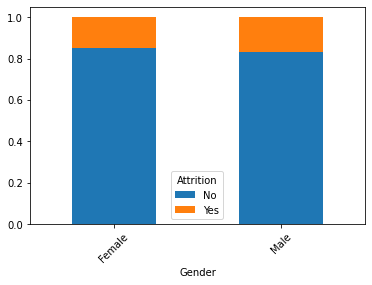

Attrition        No       Yes
Gender                       
Female     0.852041  0.147959
Male       0.829932  0.170068

**************************************************
---------
JobRole |
---------


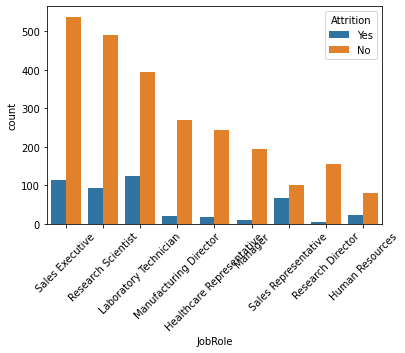

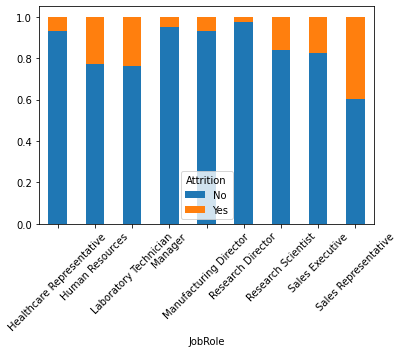

Attrition                        No       Yes
JobRole                                      
Healthcare Representative  0.931298  0.068702
Human Resources            0.769231  0.230769
Laboratory Technician      0.760618  0.239382
Manager                    0.950980  0.049020
Manufacturing Director     0.931034  0.068966
Research Director          0.975000  0.025000
Research Scientist         0.839041  0.160959
Sales Executive            0.825153  0.174847
Sales Representative       0.602410  0.397590

**************************************************
---------------
MaritalStatus |
---------------


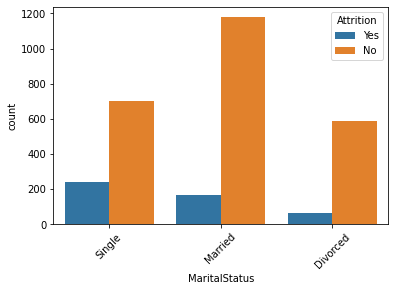

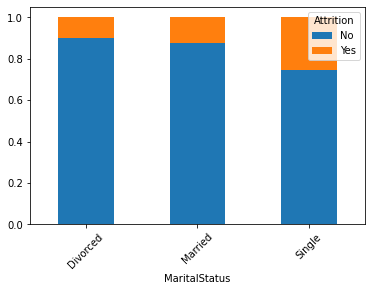

Attrition            No       Yes
MaritalStatus                    
Divorced       0.899083  0.100917
Married        0.875186  0.124814
Single         0.744681  0.255319

**************************************************
--------
Over18 |
--------


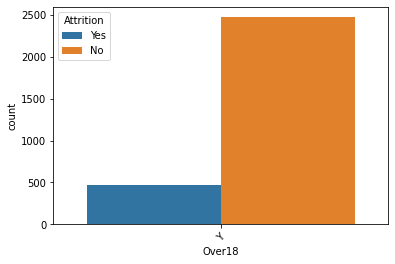

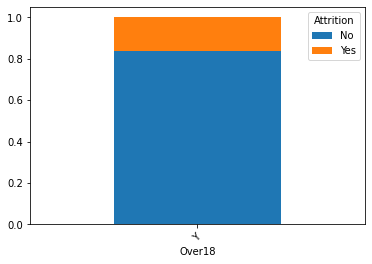

Attrition        No       Yes
Over18                       
Y          0.838776  0.161224

**************************************************
----------
OverTime |
----------


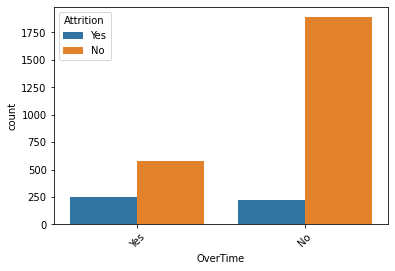

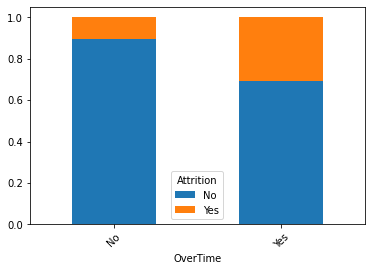

Attrition        No       Yes
OverTime                     
No         0.895636  0.104364
Yes        0.694712  0.305288

**************************************************


In [97]:
for i in data_cat.columns:
    print('-'*(len(i)+2))
    print(i,'|')
    print('-'*(len(i)+2))
    sns.countplot(x = i, data = data_cat, hue = 'Attrition')
    plt.xticks(rotation=45)
    plt.show()
    pd.crosstab(data_cat[i], data_cat['Attrition'], normalize='index').plot(kind='bar', stacked=True)
    plt.xticks(rotation=45)
    plt.show()
    print(pd.crosstab(data_cat[i], data_cat['Attrition'], normalize='index'))
    print('')
    print('*'*50)

-> Pada Business Travel, travel frequently memiliki rasio attrition terbesar<p>
-> Pada Education Field, rasio attrition terbesar berturut- turut adalah tech degree, HR, Marketing<p>
-> Pada Job Role, rasio attrition terbesar berturut- turut adalah sales representative, lab tech, HR<p>
-> Pada Status, rasio attrition terbesar pada status single<p>
-> Pada Overtime, rasio attrition terbesar pada Yes<p>

Dapat dilihat pola bahwa sepertinya attrition terbesar adalah yang berhubungan dengan tech(lab tech), marketing(sales), HR(HR)<p>
Dugaan sementara adanya hubungan antara overtime dengan pekerjaan seperti lab tech, sales, dan hr 

## Melakukan Hipotesis Testing dengan ttest dan anova

In [12]:
H0 = datax[datax['Attrition']=='Yes']['TotalWorkingYears']
H1 = datax[datax['Attrition']=='No']['TotalWorkingYears']
ttest = ttest_ind(H0, H1,alternative = 'two-sided')
print(ttest)

Ttest_indResult(statistic=-9.410912409729871, pvalue=9.603230829038466e-21)


-> H0 diterima

In [17]:
model = ols('Age ~ C(Department)', data=datax).fit()
aov_table = sm.stats.anova_lm(model, typ=2)
aov_table

,sum_sq,df,F,PR(>F)
C(Department),255.622035,2.0,1.532572,0.216152
Residual,244935.311298,2937.0,NaN,NaN


-> H0 ditolak